<a href="https://colab.research.google.com/github/mithileshgau/Openpose-Analysis-/blob/main/Openpose_Analysis_for_Badminton_Player_Movement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
OPENPOSE_PATH="./openpose/"
HOME_PATH='./'

In [ ]:
!echo $HOME_PATH

./


In [ ]:
#@title
!pip install ffmpeg-python
from os.path import exists, join, basename, splitext

def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))


# see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
# install new CMake becaue of CUDA10
!wget -q https://cmake.org/files/v3.17/cmake-3.17.2-Linux-x86_64.tar.gz
!tar xfz cmake-3.17.2-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local

# install system dependencies
!apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
!rm -rf openpose
# clone openpose
!git clone -q --depth 1 $git_repo_url
# --recursive necessary in the line below, as otherwise you can (sometimes) get "lpthreads" errors in cmake ("undefined reference to `pthread_create'" etc). See, for example, https://github.com/facebookarchive/caffe2/issues/1234
!sed -i 's/execute_process(COMMAND git checkout --recursive master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
!cd openpose && git submodule update --init --recursive --remote

Selecting previously unselected package liblmdb0:amd64.
(Reading database ... 120882 files and directories currently installed.)
Preparing to unpack .../00-liblmdb0_0.9.24-1build2_amd64.deb ...
Unpacking liblmdb0:amd64 (0.9.24-1build2) ...
Selecting previously unselected package libgflags2.2.
Preparing to unpack .../01-libgflags2.2_2.2.2-2_amd64.deb ...
Unpacking libgflags2.2 (2.2.2-2) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../02-libgflags-dev_2.2.2-2_amd64.deb ...
Unpacking libgflags-dev (2.2.2-2) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../03-libgoogle-glog0v5_0.5.0+really0.4.0-2_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.5.0+really0.4.0-2) ...
Selecting previously unselected package libunwind-dev:amd64.
Preparing to unpack .../04-libunwind-dev_1.3.2-2build2.1_amd64.deb ...
Unpacking libunwind-dev:amd64 (1.3.2-2build2.1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to un

In [ ]:
! wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh" -O models.zip && rm -rf /tmp/cookies.txt

--2023-12-01 19:56:56--  https://docs.google.com/uc?export=download&confirm=t&id=1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh
Resolving docs.google.com (docs.google.com)... 74.125.142.113, 74.125.142.138, 74.125.142.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.142.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-b0-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fn0bg2isgof8tv53dkfctjs52rkikr1u/1701460575000/01999283555521790548/*/1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh?e=download&uuid=08866e28-02fa-464f-95ef-e03926bea916 [following]
--2023-12-01 19:56:57--  https://doc-08-b0-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/fn0bg2isgof8tv53dkfctjs52rkikr1u/1701460575000/01999283555521790548/*/1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh?e=download&uuid=08866e28-02fa-464f-95ef-e03926bea916
Resolving doc-08-b0-docs.googleusercontent.com (doc-08-b0-docs.googleusercontent.com)... 142.250.107.132,

In [ ]:
#@title
# Workaround for server connection problem ("file DOWNLOAD HASH mismatch"),see, e.g.,
# https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/1602#issuecomment-641653411
!apt-get install unzip

# !wget -O models.zip  --no-check-certificate -r 'https://drive.google.com/uc?id=1QCSxJZpnWvM00hx49CJ2zky7PWGzpcEh&export=download'
!unzip -o models.zip -d openpose

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unzip is already the newest version (6.0-26ubuntu3.1).
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.
Archive:  models.zip
 extracting: openpose/models/pose/coco/pose_iter_440000.caffemodel  
 extracting: openpose/models/pose/coco/main.html  
 extracting: openpose/models/pose/mpi/pose_iter_160000.caffemodel  
 extracting: openpose/models/pose/body_25/pose_iter_584000.caffemodel  
 extracting: openpose/models/pose/body_25/training_results_source.txt  
 extracting: openpose/models/pose/body_25/training_log.txt  
   creating: openpose/models/pose/body_21a_video/
 extracting: openpose/models/pose/body_21a_video/pose_deploy.prototxt  
 extracting: openpose/models/pose/body_21a_video/pose_iter_264000.caffemodel  
   creating: openpose/models/pose/1_25BSuperModel11FullVGG/
   creating: openpose/models/pose/1_25BSuperModel11FullVGG/body_25b/
 extracting: openpose/models/pose/1_25BS

In [ ]:
# use 'sed' to comment out the line in the OpenPose repo that downloads the model from the failed link
! sed -i 's/executeShInItsFolder "getModels.sh"/# executeShInItsFolder "getModels.sh"/g' ./openpose/scripts/ubuntu/install_openpose_JetsonTX2_JetPack3.1.sh
! sed -i 's/executeShInItsFolder "getModels.sh"/# executeShInItsFolder "getModels.sh"/g' ./openpose/scripts/ubuntu/install_openpose_JetsonTX2_JetPack3.3.sh
! sed -i 's/download_model("BODY_25"/# download_model("BODY_25"/g' ./openpose/CMakeLists.txt
! sed -i 's/78287B57CF85FA89C03F1393D368E5B7/# 78287B57CF85FA89C03F1393D368E5B7/g' ./openpose/CMakeLists.txt
! sed -i 's/download_model("body (COCO)"/# download_model("body (COCO)"/g' ./openpose/CMakeLists.txt
! sed -i 's/5156d31f670511fce9b4e28b403f2939/# 5156d31f670511fce9b4e28b403f2939/g' ./openpose/CMakeLists.txt
! sed -i 's/download_model("body (MPI)"/# download_model("body (MPI)"/g' ./openpose/CMakeLists.txt
! sed -i 's/2ca0990c7562bd7ae03f3f54afa96e00/# 2ca0990c7562bd7ae03f3f54afa96e00/g' ./openpose/CMakeLists.txt
! sed -i 's/download_model("face"/# download_model("face"/g' ./openpose/CMakeLists.txt
! sed -i 's/e747180d728fa4e4418c465828384333/# e747180d728fa4e4418c465828384333/g' ./openpose/CMakeLists.txt
! sed -i 's/download_model("hand"/# download_model("hand"/g' ./openpose/CMakeLists.txt
! sed -i 's/a82cfc3fea7c62f159e11bd3674c1531/# a82cfc3fea7c62f159e11bd3674c1531/g' ./openpose/CMakeLists.txt

In [ ]:
! ls -lha /usr/lib/x86_64-linux-gnu

total 5.7G
drwxr-xr-x  1 root root  4.0K Dec  1 19:56 .
drwxr-xr-x  1 root root  4.0K Nov 30 14:16 ..
drwxr-xr-x  2 root root  4.0K Nov 30 14:14 atlas
drwxr-xr-x  2 root root  4.0K Oct  4 02:11 audit
drwxr-xr-x  2 root root  4.0K Nov 30 14:15 avahi
drwxr-xr-x  2 root root  4.0K Nov 10 06:52 bfd-plugins
drwxr-xr-x  2 root root  4.0K Nov 30 14:13 blas
drwxr-xr-x  2 root root  4.0K Nov 30 14:15 caca
drwxr-xr-x  3 root root  4.0K Nov 30 14:13 ceph
drwxr-xr-x  1 root root  4.0K Dec  1 19:56 cmake
-rw-r--r--  1 root root  1.8K Sep 25 14:45 crt1.o
-rw-r--r--  1 root root  1.2K Sep 25 14:45 crti.o
-rw-r--r--  1 root root   760 Sep 25 14:45 crtn.o
drwxr-xr-x  2 root root  4.0K Nov 30 14:15 dri
drwxr-xr-x  2 root root  4.0K Oct  4 02:11 e2fsprogs
drwxr-xr-x  1 root root  4.0K Nov 30 14:13 engines-3
drwxr-xr-x  4 root root  4.0K Nov 30 14:16 fortran
drwxr-xr-x  3 root root   12K Oct  4 02:11 gconv
-rw-r--r--  1 root root  2.5K Sep 25 14:45 gcrt1.o
drwxr-xr-x  2 root root  4.0K Nov 30 14:16 gdcm-3

In [ ]:
# build openpose
# CUDA
# !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. -DUSE_CUDNN=OFF && make -j`nproc`
#!cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc`
# CPU
# !cd openpose && rm -rf build || true && mkdir build && cd build && cmake -DGPU_MODE=CPU_ONLY -DUSE_MKL=OFF .. && cmake --build . --config Release && make -j`nproc`

!cd openpose && rm -rf build || true && mkdir build

In [ ]:
cmake_file='/content/openpose/CMakeLists.txt'
!cd openpose && sed -i 's/-DBUILD_python=OFF/-DBUILD_python=ON/g' $cmake_file
!cd openpose && sed -i 's/-DBUILD_python_layer=OFF/-DBUILD_python_layer=ON/g' $cmake_file

!cd openpose && sed -i 's/option(BUILD_PYTHON "Build OpenPose python." OFF)/option(BUILD_PYTHON "OpenPose python." ON)\noption(BUILD_BIN_FOLDER "Copy 3rd-party DLL files." ON)/g' $cmake_file

In [ ]:
# CUDA
!cd openpose && cd build && cmake .. -DUSE_CUDNN=OFF -DGENERATE_PYTHON_BINDINGS:BOOL="1" -DPYTHON_LIBRARY='/usr/lib/x86_64-linux-gnu/libpython3.10.so' && make -j`nproc`


-- The C compiler identification is GNU 11.4.0
-- The CXX compiler identification is GNU 11.4.0
-- Check for working C compiler: /usr/bin/cc
-- Check for working C compiler: /usr/bin/cc - works
-- Detecting C compiler ABI info
-- Detecting C compiler ABI info - done
-- Detecting C compile features
-- Detecting C compile features - done
-- Check for working CXX compiler: /usr/bin/c++
-- Check for working CXX compiler: /usr/bin/c++ - works
-- Detecting CXX compiler ABI info
-- Detecting CXX compiler ABI info - done
-- Detecting CXX compile features
-- Detecting CXX compile features - done
-- GCC detected, adding compile flags
-- GCC detected, adding compile flags
-- Looking for pthread.h
-- Looking for pthread.h - found
-- Performing Test CMAKE_HAVE_LIBC_PTHREAD
-- Performing Test CMAKE_HAVE_LIBC_PTHREAD - Success
-- Found Threads: TRUE  
-- Found CUDA: /usr/local/cuda (found version "11.8") 
-- Building with CUDA.
-- CUDA detected: 11.8
-- Added CUDA NVCC flags for: sm_75
-- Found cuDNN

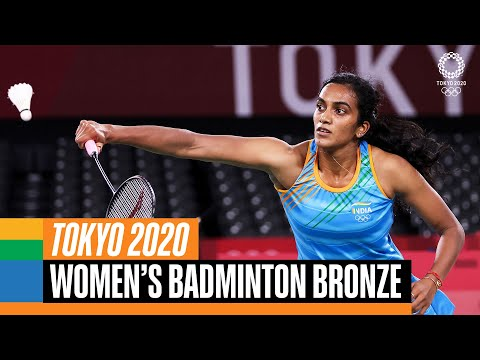

In [ ]:
from IPython.display import YouTubeVideo

YOUTUBE_ID = 'JRF8mECyOJY'
YouTubeVideo(YOUTUBE_ID)

In [ ]:
# ! sudo -H pip install --upgrade youtube-dl
! pip install --upgrade --force-reinstall "git+https://github.com/ytdl-org/youtube-dl.git"

  Cloning https://github.com/ytdl-org/youtube-dl.git to /tmp/pip-req-build-2kwhw5gq
  Running command git clone --filter=blob:none --quiet https://github.com/ytdl-org/youtube-dl.git /tmp/pip-req-build-2kwhw5gq
  Resolved https://github.com/ytdl-org/youtube-dl.git to commit 427472351ce6b2fcf5bb35dde32bf9ee5beddd89
  Preparing metadata (setup.py) ... done
  Created wheel for youtube-dl: filename=youtube_dl-2021.12.17-py2.py3-none-any.whl size=1940284 sha256=609967d08c0971a625fe9d0abbf125d9b9a895de0fbdfb6c86cc293f72ebd6b3
  Stored in directory: /tmp/pip-ephem-wheel-cache-a0_no7q2/wheels/64/8e/40/866e846163e3e4859bbe820ff8847ec97f4320864f1525aa9a
Successfully built youtube-dl


In [ ]:
!rm -rf youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
# cut the first 5 seconds
!ffmpeg -y -loglevel info -i youtube.mp4 -ss 390 -t 30 video.mp4

[youtube] JRF8mECyOJY: Downloading webpage
[youtube] JRF8mECyOJY: Downloading player 31e0b6d9
[dashsegments] Total fragments: 69
[download] Destination: youtube.mp4
[download] 100% of 685.77MiB in 00:35
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband -

In [ ]:
# detect poses on the these 5 seconds
!cd $OPENPOSE_PATH && rm ../openpose.avi
!cd $OPENPOSE_PATH && chmod -R 755 './build/'
!cd $OPENPOSE_PATH && ./build/examples/openpose/openpose.bin --video ../video.mp4 --write_json '/content/drive/MyDrive/Colab Notebooks/DVP/Project/output_json' --display 0  --write_video ../openpose.avi
# convert the result into MP4
!ffmpeg -y -loglevel info -i openpose.avi output.mp4

rm: cannot remove '../openpose.avi': No such file or directory
Starting OpenPose demo...
Configuring OpenPose...
Starting thread(s)...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
OpenPose demo successfully finished. Total time: 112.051225 seconds.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

SINGLE FRAME EXTRACTION

In [ ]:
import cv2

# Replace 'input_video.mp4' with the path to your video file
input_video_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/input/input_video.mp4'

# Replace 'output_frame.jpg' with the desired name and format for the extracted frame
output_frame_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg'

# Specify the time in the video from which you want to extract the frame (in seconds)
time_in_seconds = 10  # Change this to the desired time

# Open the video file
video_capture = cv2.VideoCapture(input_video_path)

# Set the video capture to the specified time
video_capture.set(cv2.CAP_PROP_POS_MSEC, time_in_seconds * 1000)

# Read the frame at the specified time
success, frame = video_capture.read()

# If frame reading is successful, save the frame
if success:
    cv2.imwrite(output_frame_path, frame)
    print(f"Frame extracted and saved as {output_frame_path}")
else:
    print("Failed to extract the frame")

# Release the video capture object
video_capture.release()



Frame extracted and saved as /content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg


Extract Player 1 and player 2 leg coordinates and store them in person.txt and person2.txt files respectively.

In [ ]:
import json
import os

def distance_from_origin(point):
    # Calculate the Euclidean distance from the origin (0, 0)
    return (point[0]**2 + point[1]**2)**0.5

def extract_keypoints(json_data, xmin, xmax, ymin, ymax):
    # Load JSON data
    data = json.loads(json_data)

    # Extract pose_keypoints_2d for each person
    all_keypoints = []
    for person in data["people"]:
        pose_keypoints_2d = person["pose_keypoints_2d"]

        # Extract x and y coordinates from pose_keypoints_2d
        x_coordinates = pose_keypoints_2d[0::3]
        y_coordinates = pose_keypoints_2d[1::3]

        if (
            (xmin <= x_coordinates[21] <= xmax and
            ymin <= y_coordinates[21] <= ymax) #or
        ):
            # leg coordinates
            all_keypoints.append([(x_coordinates[21], y_coordinates[21]), (x_coordinates[23], y_coordinates[23])])

    return all_keypoints

# Function to read JSON data from a file
def read_json_file(file_path):
    with open(file_path, 'r') as file:
        return file.read()

# Function to write data to a text file with labels
def write_to_text_file(file_path, data, label):
    with open(file_path, 'a') as file:
        file.write(f"{label}:\n")
        for entry in data:
            file.write(json.dumps(entry) + ',\n')

# Folder path containing JSON files
folder_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/output_json/'
output_file_path_person1 = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person1.txt'
output_file_path_person2 = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person2.txt'

# List all JSON files in the folder
json_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.json')])
keypoints_person_1 = []
keypoints_person_2 = []

# Process each JSON file
for json_file in json_files:
    file_path = os.path.join(folder_path, json_file)
    json_data = read_json_file(file_path)

    xmin, xmax, ymin, ymax = 300, 1650, 427, 1000
    res = extract_keypoints(json_data, xmin, xmax, ymin, ymax)

    # Determine which set of keypoints is closer to the origin (0,0)
    if len(res) == 2:
        distance_1 = res[0][1][1]
        distance_2 = res[1][1][1]

        # Assign keypoints to person 1 and person 2
        person_1 = res[0] if distance_1 < distance_2 else res[1]
        person_2 = res[1] if distance_1 < distance_2 else res[0]

        keypoints_person_1.append(person_1)
        keypoints_person_2.append(person_2)

# add 5 points in the end
for i in range(5):
  keypoints_person_1.append(person_1)
  keypoints_person_2.append(person_2)

# Write datas
write_to_text_file(output_file_path_person1, keypoints_person_1, "Person 1")
write_to_text_file(output_file_path_person2, keypoints_person_2, "Person 2")


Perform Occulsion on the leg coordinate data.

In [ ]:
# Function to replace zero values with nearest non-zero values
def replace_zeros_with_nearest(data, max_distance=6):
    for i in range(len(data)):
        if data[i][1][0] == 0:
            for k in range(1, max_distance + 1):
                # Check previous k values
                if i - k >= 0 and data[i - k][1][0] != 0:
                    data[i][1] = data[i - k][1]
                    break
                # Check next k values
                elif i + k < len(data) and data[i + k][1][0] != 0:
                    data[i][1] = data[i + k][1]
                    break
    return data


keypoints_person_1_fixed = replace_zeros_with_nearest(keypoints_person_1)
keypoints_person_2_fixed = replace_zeros_with_nearest(keypoints_person_2)

# Write data
output_file_path_person1_occuled = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_1_occuled.txt'
output_file_path_person2_occuled = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt'

write_to_text_file(output_file_path_person1_occuled, keypoints_person_1_fixed, "Person 1 (Occuled)")
write_to_text_file(output_file_path_person2_occuled, keypoints_person_2_fixed, "Person 2 (Occuled)")


RECONSTRUCTING VIDEO USING LEG COORDINATES

In [ ]:
import cv2

# Path to the video file
video_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/input/input_video.mp4'  # Replace with your video path

# Function to filter out lines starting with 'Person'
def filter_person_lines(lines):
    return [line.strip() for line in lines if not line.startswith('Person')]

# Read coordinates from Person 1 and Person 2 text files
with open('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_1_occuled.txt', 'r') as file:
    lines_person1 = file.readlines()

with open('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt', 'r') as file:
    lines_person2 = file.readlines()

# Filter out lines starting with 'Person'
lines_person1 = filter_person_lines(lines_person1)
lines_person2 = filter_person_lines(lines_person2)

# Function to convert lines to coordinates
def convert_lines_to_coordinates(lines):
    coordinates = []
    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        coordinates.append([[float(line[0]), float(line[1])], [float(line[2]), float(line[3])]])
    return coordinates

# Convert coordinates for Person 1 and Person 2
person1_coordinates = convert_lines_to_coordinates(lines_person1)
person2_coordinates = convert_lines_to_coordinates(lines_person2)

# Initialize the video capture object
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('/content/drive/MyDrive/Colab Notebooks/DVP/Project/output video/new_video.mp4', fourcc, fps, (width, height))

frame_number = 0

# Read each frame and plot the coordinates
while True:
    ret, frame = cap.read()

    if not ret:
        break

    # Retrieve coordinates for current frame
    person1_coord = person1_coordinates[frame_number]
    person2_coord = person2_coordinates[frame_number]

    # Plotting points for Person 1 (Green color)
    cv2.circle(frame, (int(person1_coord[0][0]), int(person1_coord[0][1])), 5, (0, 255, 0), -1)
    cv2.circle(frame, (int(person1_coord[1][0]), int(person1_coord[1][1])), 5, (0, 255, 0), -1)

    # Plotting points for Person 2 (Red color)
    cv2.circle(frame, (int(person2_coord[0][0]), int(person2_coord[0][1])), 5, (0, 0, 255), -1)
    cv2.circle(frame, (int(person2_coord[1][0]), int(person2_coord[1][1])), 5, (0, 0, 255), -1)

    # Write the modified frame to the output video
    out.write(frame)
    frame_number += 1

# Release the video capture and writer objects
cap.release()
out.release()
cv2.destroyAllWindows()




ANALYSIS - TOTAL AVERAGE SPEED

In [ ]:
import cv2
import numpy as np

# Function to calculate Euclidean distance between two points
def euclidean_distance(point1, point2):
    return np.sqrt((point2[0] - point1[0]) ** 2 + (point2[1] - point1[1]) ** 2)

# Replace the given coordinates extraction with your file paths
# Read coordinates from the text files for Person 1 and Person 2
with open('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_1_occuled.txt', 'r') as file:
    lines_person1 = [line.strip() for line in file.readlines() if not line.startswith('Person')]

with open('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt', 'r') as file:
    lines_person2 = [line.strip() for line in file.readlines() if not line.startswith('Person')]

# Function to convert lines to coordinates
def convert_lines_to_coordinates(lines):
    coordinates = []
    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        coordinates.append([[float(line[0]), float(line[1])], [float(line[2]), float(line[3])]])
    return coordinates

# Convert coordinates for Person 1 and Person 2
person1_coordinates = convert_lines_to_coordinates(lines_person1)
person2_coordinates = convert_lines_to_coordinates(lines_person2)

# Path to the video file
video_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/input/input_video.mp4'  # Replace with your video path

# Initialize the video capture object
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('/content/drive/MyDrive/Colab Notebooks/DVP/Project/output video/speed_video.mp4', fourcc, fps, (width, height))

# Process each frame and calculate speed for Person 1 and Person 2
frame_number = 0
previous_person1_coord = None
previous_person2_coord = None
total_speed_person1 = 0
total_speed_person2 = 0
num_frames = 0

while True:
    ret, frame = cap.read()

    if not ret:
        break

    # Retrieve coordinates for current frame for Person 1 and Person 2
    current_person1_coord = person1_coordinates[frame_number]
    current_person2_coord = person2_coordinates[frame_number]

    # Calculate speed for frames after the first one for Person 1
    if frame_number > 0:
        # Calculate Euclidean distance between consecutive frames for Person 1
        distance_person1 = euclidean_distance(previous_person1_coord[1], current_person1_coord[1])

        # Calculate speed for Person 1 (distance per second for 25 fps)
        speed_person1 = distance_person1 * fps

        # Annotate frame with calculated speed for Person 1
        cv2.putText(frame, f"Person 1 Speed: {speed_person1:.2f} px/s", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1,
                    (255, 255, 255), 2, cv2.LINE_AA)

        # Calculate Euclidean distance between consecutive frames for Person 2
        distance_person2 = euclidean_distance(previous_person2_coord[1], current_person2_coord[1])

        # Calculate speed for Person 2 (distance per second for 25 fps)
        speed_person2 = distance_person2 * fps

        # Annotate frame with calculated speed for Person 2
        cv2.putText(frame, f"Person 2 Speed: {speed_person2:.2f} px/s", (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1,
                    (255, 255, 255), 2, cv2.LINE_AA)

        # Accumulate total speed for both persons
        total_speed_person1 += speed_person1
        total_speed_person2 += speed_person2
        num_frames += 1

    # Write the modified frame to the output video
    out.write(frame)
    frame_number += 1
    previous_person1_coord = current_person1_coord
    previous_person2_coord = current_person2_coord

# Release the video capture and writer objects
cap.release()
out.release()
cv2.destroyAllWindows()

if num_frames > 0:
    avg_speed_person1 = total_speed_person1 / num_frames
    avg_speed_person2 = total_speed_person2 / num_frames
    print(f"Total Average Speed for Person 1: {avg_speed_person1:.2f} px/s")
    print(f"Total Average Speed for Person 2: {avg_speed_person2:.2f} px/s")
else:
    print("No frames processed.")



Total Average Speed for Person 1: 170.29 px/s
Total Average Speed for Person 2: 345.07 px/s


ANALYSIS - QUADRANT DOMINANCE PLAYER 1

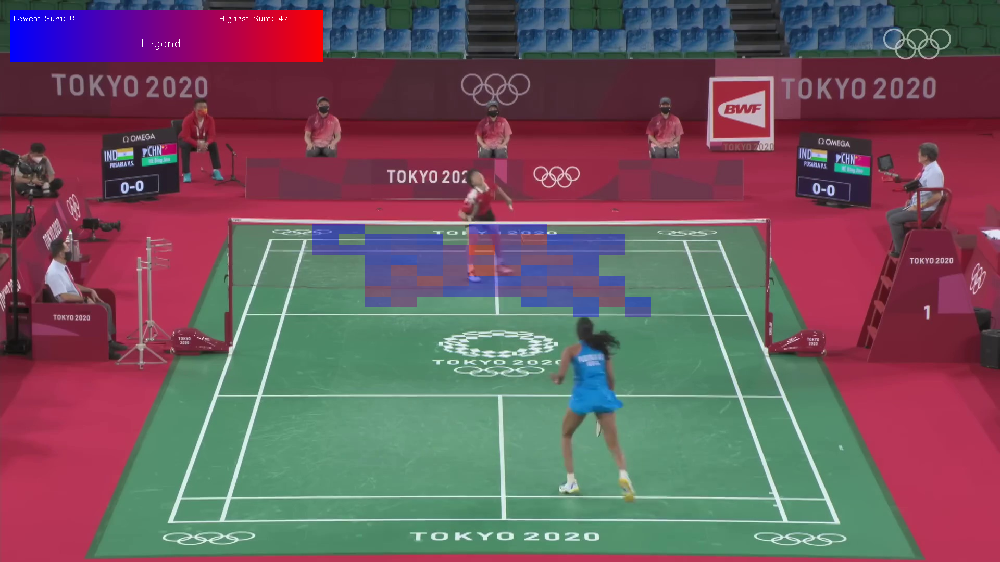

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def create_quadrant_dominance(rectangle_coords_path, reference_image_path):
    # Your existing code remains the same...
    rectangle_coords = [
        (450, 430),
        (1450, 430),
        (450, 650),
        (1450, 650)
    ]

    result_matrix = [[0] * (1450 - 450) for _ in range(650 - 430)]

    with open(rectangle_coords_path, 'r') as file:
        lines = [line.strip() for line in file.readlines() if not line.startswith('Person')]

    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        left_leg = (round(float(line[0])), round(float(line[1])))
        right_leg = (round(float(line[2])), round(float(line[3])))
        result_matrix[left_leg[1] - 430][left_leg[0] - 450] += 1
        result_matrix[right_leg[1] - 430][right_leg[0] - 450] += 1

    max_sum = max([max(row) for row in result_matrix])
    min_sum = min([min(row) for row in result_matrix])

    def color_code_tiles(matrix):
        max_sum = max([max(row) for row in matrix if sum(row) > 0], default=255)
        min_sum = min([min(row) for row in matrix if sum(row) > 0], default=255)

        colored_matrix = np.zeros((len(matrix), len(matrix[0]), 3), dtype=np.uint8)

        for i in range(0, len(matrix), 20):
            for j in range(0, len(matrix[0]), 50):
                block_sum = sum(sum(matrix[i:i + 20, j:j + 50]))
                if block_sum > 0:
                    intensity = int(((block_sum - min_sum) / (max_sum - min_sum)) * 255)
                    color = (255 - intensity, 0, intensity)
                    colored_matrix[i:i + 20, j:j + 50] = color

        return colored_matrix

    def create_legend(min_sum, max_sum):
        # Your existing legend creation code remains the same...
        legend = np.zeros((100, 600, 3), dtype=np.uint8)

        for i in range(600):
            intensity = int((i / 600) * 255)
            color = (255 - intensity, 0, intensity)
            cv2.rectangle(legend, (i, 0), (i + 1, 100), color, -1)

        cv2.putText(legend, f"Lowest Sum: {min_sum}", (5, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, f"Highest Sum: {max_sum}", (400, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, "Legend", (250, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 1)

        return legend

    # Load reference image
    output_frame = cv2.imread(reference_image_path)

    # Color code the tiles
    colored_result_matrix = color_code_tiles(np.array(result_matrix))

    # Overlay the colored matrix onto the output frame
    mask = np.any(colored_result_matrix != [0, 0, 0], axis=-1)  # Create a mask excluding black tiles
    overlay = output_frame.copy()
    overlay[430:650, 450:1450][mask] = colored_result_matrix[mask]

    alpha = 0.4  # Adjust transparency here if needed
    cv2.addWeighted(overlay, alpha, output_frame, 1 - alpha, 0, output_frame)

    # Create legend and place it on the output frame
    legend = create_legend(min_sum, max_sum)
    output_frame[20:120, 20:620] = legend

    return output_frame

# Usage example:
person1_quadrant_dominance = create_quadrant_dominance('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/correct_1_occuled.txt', '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg')

cv2_imshow(person1_quadrant_dominance)
cv2.waitKey(0)
cv2.destroyAllWindows()


ANALYSIS - QUADRANT DOMINANCE PLAYER 2

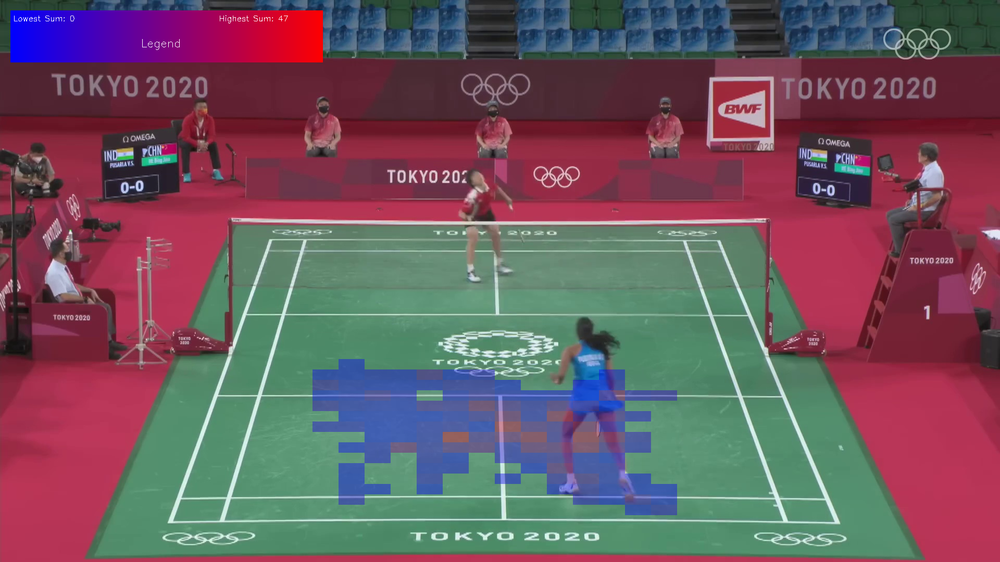

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def create_quadrant_dominance(rectangle_coords_path, reference_image_path):
    # Your existing code remains the same...
    rectangle_coords = [
        (350, 650),
        (1450, 650),
        (350, 1050),
        (1450, 1050)
    ]

    result_matrix = [[0] * (1450 - 350) for _ in range(1050 - 650)]

    with open(rectangle_coords_path, 'r') as file:
        lines = [line.strip() for line in file.readlines() if not line.startswith('Person')]

    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        left_leg = (round(float(line[0])), round(float(line[1])))
        right_leg = (round(float(line[2])), round(float(line[3])))
        result_matrix[left_leg[1] - 650][left_leg[0] - 350] += 1
        result_matrix[right_leg[1] - 650][right_leg[0] - 350] += 1

    max_sum = max([max(row) for row in result_matrix])
    min_sum = min([min(row) for row in result_matrix])

    def color_code_tiles(matrix):
        max_sum = max([max(row) for row in matrix if sum(row) > 0], default=255)
        min_sum = min([min(row) for row in matrix if sum(row) > 0], default=255)

        colored_matrix = np.zeros((len(matrix), len(matrix[0]), 3), dtype=np.uint8)

        for i in range(0, len(matrix), 20):
            for j in range(0, len(matrix[0]), 50):
                block_sum = sum(sum(matrix[i:i + 20, j:j + 50]))
                if block_sum > 0:
                    intensity = int(((block_sum - min_sum) / (max_sum - min_sum)) * 255)
                    color = (255 - intensity, 0, intensity)
                    colored_matrix[i:i + 20, j:j + 50] = color

        return colored_matrix

    def create_legend(min_sum, max_sum):
        # Your existing legend creation code remains the same...
        legend = np.zeros((100, 600, 3), dtype=np.uint8)

        for i in range(600):
            intensity = int((i / 600) * 255)
            color = (255 - intensity, 0, intensity)
            cv2.rectangle(legend, (i, 0), (i + 1, 100), color, -1)

        cv2.putText(legend, f"Lowest Sum: {min_sum}", (5, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, f"Highest Sum: {max_sum}", (400, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, "Legend", (250, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 1)

        return legend

    # Load reference image
    output_frame = cv2.imread(reference_image_path)

    # Color code the tiles
    colored_result_matrix = color_code_tiles(np.array(result_matrix))

    # Overlay the colored matrix onto the output frame
    mask = np.any(colored_result_matrix != [0, 0, 0], axis=-1)  # Create a mask excluding black tiles
    overlay = output_frame.copy()
    overlay[650:1050, 350:1450][mask] = colored_result_matrix[mask]

    alpha = 0.4  # Adjust transparency here if needed
    cv2.addWeighted(overlay, alpha, output_frame, 1 - alpha, 0, output_frame)

    # Create legend and place it on the output frame
    legend = create_legend(min_sum, max_sum)
    output_frame[20:120, 20:620] = legend

    return output_frame

# Usage example:
person1_quadrant_dominance = create_quadrant_dominance('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt', '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg')

cv2_imshow(person1_quadrant_dominance)
cv2.waitKey(0)
cv2.destroyAllWindows()


ANALYSIS - TOTAL DISTANCE TRAVELLED

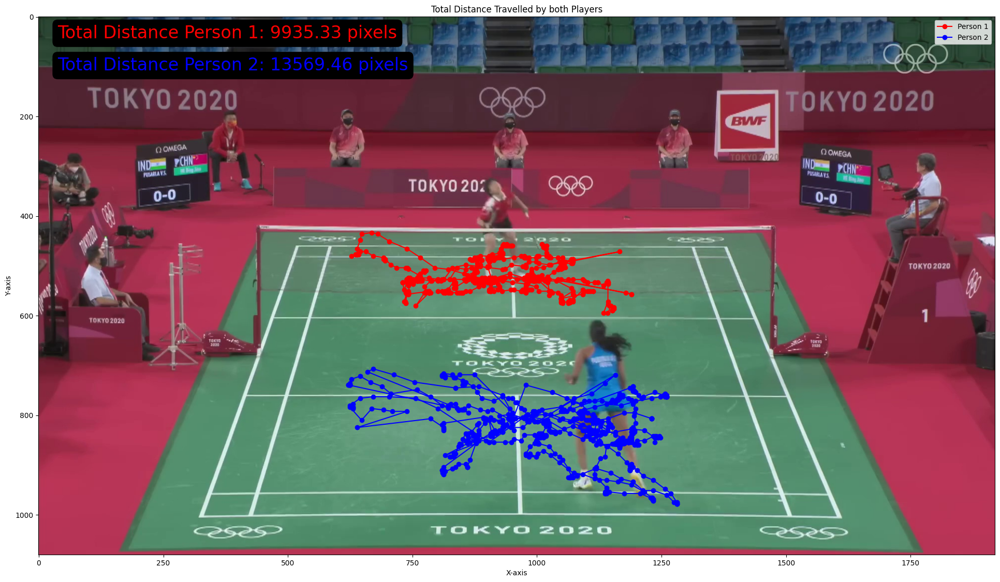

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def calculate_distance(prev_point1, prev_point2, point1, point2):
    sqr1 = ((point1[0] - prev_point1[0])**2 + (point1[1] - prev_point1[1])**2)**0.5
    sqr2 = ((point2[0] - prev_point2[0])**2 + (point2[1] - prev_point2[1])**2)**0.5
    return max(sqr1, sqr2)

def process_file(file_path):
    total_distance = 0

    with open(file_path, "r") as file:
        lines = file.readlines()[1:]
        i = 0

        for line in lines:
            coordinates = eval(line)

            if i == 0:
                i = 1
                prev_point1 = coordinates[0][0]
                prev_point2 = coordinates[0][1]
                continue

            distance = calculate_distance(prev_point1, prev_point2, coordinates[0][0], coordinates[0][1])
            total_distance += distance
            prev_point1 = coordinates[0][0]
            prev_point2 = coordinates[0][1]

    return total_distance

# Generate coordinates for both persons
def read_person_coordinates(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    coordinates = []
    for line in lines:
        if '[' in line and ']' in line:
            coordinates.append(eval(line.strip()))
    return coordinates

def extract_second_values(coordinates):
    second_values = [row[0][1] for row in coordinates]
    return second_values

# Read Person 1 coordinates from the text file
person1_file_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_1_occuled.txt'
person1_coordinates = read_person_coordinates(person1_file_path)
person1_coord = extract_second_values(person1_coordinates)
# Extract x and y coordinates for Person 1
x_values_person1, y_values_person1 = zip(*person1_coord)
total_distance_person1 = process_file(person1_file_path)


# Read Person 2 coordinates from the text file
person2_file_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt'
person2_coordinates = read_person_coordinates(person2_file_path)
person2_coord = extract_second_values(person2_coordinates)
# Extract x and y coordinates for Person 2
x_values_person2, y_values_person2 = zip(*person2_coord)

x_values_person2 = list(x_values_person2)
y_values_person2 = list(y_values_person2)

for i in range(len(y_values_person2)):
    if y_values_person2[i] < 660:
        x_values_person2[i] = x_values_person2[i-1]
        y_values_person2[i] = y_values_person2[i-1]

x_values_person2 = tuple(x_values_person2)
y_values_person2 = tuple(y_values_person2)
total_distance_person2 = process_file(person2_file_path)

image_path = '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg'
# Load the image
img = mpimg.imread(image_path)

# Set the size of the image
fig, ax = plt.subplots(figsize=(img.shape[1]/80, img.shape[0]/80))

# Plot the image
ax.imshow(img)

# Plot points for Person 1 in blue
ax.plot(x_values_person1, y_values_person1, marker='o', linestyle='-', color='red', label='Person 1')

# Plot points for Person 2 in red
ax.plot(x_values_person2, y_values_person2, marker='o', linestyle='-', color='blue', label='Person 2')

# Set labels for the axes
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

# Set a title for the graph
ax.set_title('Total Distance Travelled by both Players')

# Show legend
ax.legend()


# Add text annotation for total distance traveled for Person 1
ax.text(0.02, 0.96, f'Total Distance Person 1: {total_distance_person1:.2f} pixels', transform=ax.transAxes, color='red', fontsize=24, bbox=dict(facecolor='black', edgecolor='none', boxstyle='round,pad=0.3'))
# Add text annotation for total distance traveled for Person 2
ax.text(0.02, 0.9, f'Total Distance Person 2: {total_distance_person2:.2f} pixels', transform=ax.transAxes, color='blue', fontsize=24, bbox=dict(facecolor='black', edgecolor='none', boxstyle='round,pad=0.3'))


plt.savefig('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Analysis Output/output_totaldistance.png', bbox_inches='tight')
# Show the graph
plt.show()

ANALYSIS - HEATMAP PLAYER 1

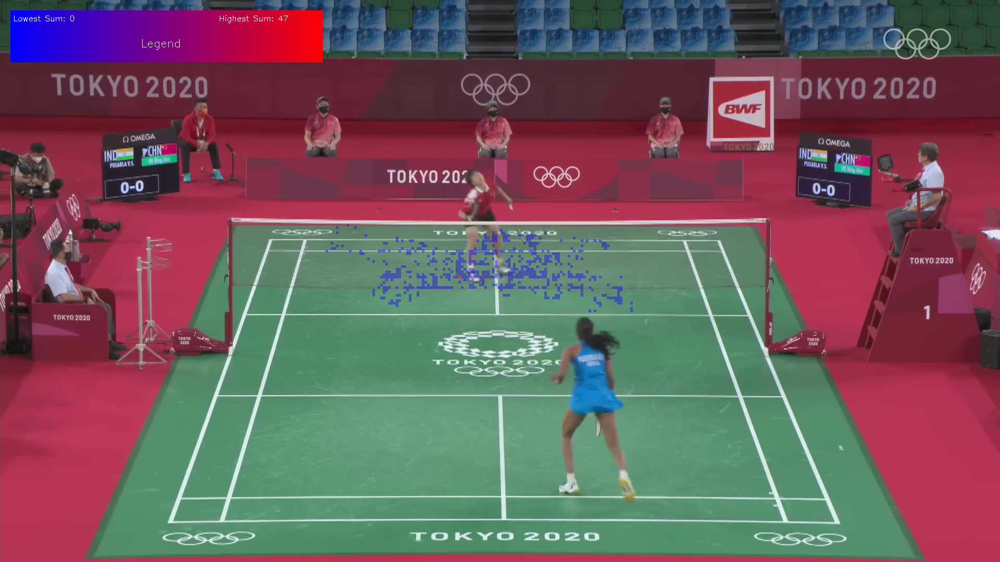

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def create_quadrant_dominance(rectangle_coords_path, reference_image_path):
    # Your existing code remains the same...
    rectangle_coords = [
        (450, 430),
        (1450, 430),
        (450, 650),
        (1450, 650)
    ]

    result_matrix = [[0] * (1450 - 450) for _ in range(650 - 430)]

    with open(rectangle_coords_path, 'r') as file:
        lines = [line.strip() for line in file.readlines() if not line.startswith('Person')]

    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        left_leg = (round(float(line[0])), round(float(line[1])))
        right_leg = (round(float(line[2])), round(float(line[3])))
        result_matrix[left_leg[1] - 430][left_leg[0] - 450] += 1
        result_matrix[right_leg[1] - 430][right_leg[0] - 450] += 1

    max_sum = max([max(row) for row in result_matrix])
    min_sum = min([min(row) for row in result_matrix])

    def color_code_tiles(matrix):
        max_sum = max([max(row) for row in matrix if sum(row) > 0], default=255)
        min_sum = min([min(row) for row in matrix if sum(row) > 0], default=255)

        colored_matrix = np.zeros((len(matrix), len(matrix[0]), 3), dtype=np.uint8)

        for i in range(0, len(matrix), 5):
            for j in range(0, len(matrix[0]), 5):
                block_sum = sum(sum(matrix[i:i + 5, j:j + 5]))
                if block_sum > 0:
                    intensity = int(((block_sum - min_sum) / (max_sum - min_sum)) * 255)
                    color = (255 - intensity, 0, intensity)
                    colored_matrix[i:i + 5, j:j + 5] = color

        return colored_matrix

    def create_legend(min_sum, max_sum):
        # Your existing legend creation code remains the same...
        legend = np.zeros((100, 600, 3), dtype=np.uint8)

        for i in range(600):
            intensity = int((i / 600) * 255)
            color = (255 - intensity, 0, intensity)
            cv2.rectangle(legend, (i, 0), (i + 1, 100), color, -1)

        cv2.putText(legend, f"Lowest Sum: {min_sum}", (5, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, f"Highest Sum: {max_sum}", (400, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, "Legend", (250, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 1)

        return legend

    # Load reference image
    output_frame = cv2.imread(reference_image_path)

    # Color code the tiles
    colored_result_matrix = color_code_tiles(np.array(result_matrix))

    # Overlay the colored matrix onto the output frame
    mask = np.any(colored_result_matrix != [0, 0, 0], axis=-1)  # Create a mask excluding black tiles
    overlay = output_frame.copy()
    overlay[430:650, 450:1450][mask] = colored_result_matrix[mask]

    alpha = 0.4  # Adjust transparency here if needed
    cv2.addWeighted(overlay, alpha, output_frame, 1 - alpha, 0, output_frame)

    # Create legend and place it on the output frame
    legend = create_legend(min_sum, max_sum)
    output_frame[20:120, 20:620] = legend

    return output_frame

# Usage example:
person1_quadrant_dominance = create_quadrant_dominance('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/correct_1_occuled.txt', '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg')

cv2_imshow(person1_quadrant_dominance)
cv2.waitKey(0)
cv2.destroyAllWindows()


ANALYSIS - HEATMAP PLAYER 2

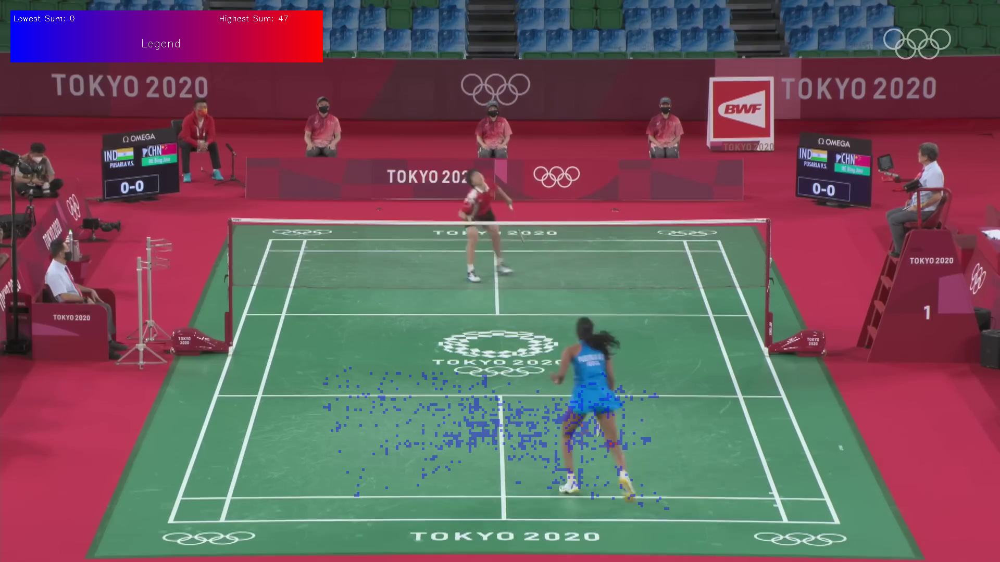

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def create_quadrant_dominance(rectangle_coords_path, reference_image_path):
    # Your existing code remains the same...
    rectangle_coords = [
        (350, 650),
        (1450, 650),
        (350, 1050),
        (1450, 1050)
    ]

    result_matrix = [[0] * (1450 - 350) for _ in range(1050 - 650)]

    with open(rectangle_coords_path, 'r') as file:
        lines = [line.strip() for line in file.readlines() if not line.startswith('Person')]

    for line in lines:
        line = line.strip().replace('[', '').replace(']', '').replace(',', '').split()
        left_leg = (round(float(line[0])), round(float(line[1])))
        right_leg = (round(float(line[2])), round(float(line[3])))
        result_matrix[left_leg[1] - 650][left_leg[0] - 350] += 1
        result_matrix[right_leg[1] - 650][right_leg[0] - 350] += 1

    max_sum = max([max(row) for row in result_matrix])
    min_sum = min([min(row) for row in result_matrix])

    def color_code_tiles(matrix):
        max_sum = max([max(row) for row in matrix if sum(row) > 0], default=255)
        min_sum = min([min(row) for row in matrix if sum(row) > 0], default=255)

        colored_matrix = np.zeros((len(matrix), len(matrix[0]), 3), dtype=np.uint8)

        for i in range(0, len(matrix), 5):
            for j in range(0, len(matrix[0]), 5):
                block_sum = sum(sum(matrix[i:i + 5, j:j + 5]))
                if block_sum > 0:
                    intensity = int(((block_sum - min_sum) / (max_sum - min_sum)) * 255)
                    color = (255 - intensity, 0, intensity)
                    colored_matrix[i:i + 5, j:j + 5] = color

        return colored_matrix

    def create_legend(min_sum, max_sum):
        # Your existing legend creation code remains the same...
        legend = np.zeros((100, 600, 3), dtype=np.uint8)

        for i in range(600):
            intensity = int((i / 600) * 255)
            color = (255 - intensity, 0, intensity)
            cv2.rectangle(legend, (i, 0), (i + 1, 100), color, -1)

        cv2.putText(legend, f"Lowest Sum: {min_sum}", (5, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, f"Highest Sum: {max_sum}", (400, 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        cv2.putText(legend, "Legend", (250, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 1)

        return legend

    # Load reference image
    output_frame = cv2.imread(reference_image_path)

    # Color code the tiles
    colored_result_matrix = color_code_tiles(np.array(result_matrix))

    # Overlay the colored matrix onto the output frame
    mask = np.any(colored_result_matrix != [0, 0, 0], axis=-1)  # Create a mask excluding black tiles
    overlay = output_frame.copy()
    overlay[650:1050, 350:1450][mask] = colored_result_matrix[mask]

    alpha = 0.4  # Adjust transparency here if needed
    cv2.addWeighted(overlay, alpha, output_frame, 1 - alpha, 0, output_frame)

    # Create legend and place it on the output frame
    legend = create_legend(min_sum, max_sum)
    output_frame[20:120, 20:620] = legend

    return output_frame

# Usage example:
person1_quadrant_dominance = create_quadrant_dominance('/content/drive/MyDrive/Colab Notebooks/DVP/Project/Person Output/person_2_occuled.txt', '/content/drive/MyDrive/Colab Notebooks/DVP/Project/single_frame/output_frame.jpg')

cv2_imshow(person1_quadrant_dominance)
cv2.waitKey(0)
cv2.destroyAllWindows()
